In [1]:
# Chord Diagram Creation for Overall, Democrat, and Republican in 2020 Senate Races

import holoviews as hv
from holoviews import opts, dim
import pandas as pd

#reading in our trimmed data from script 6
overall = pd.read_csv('C:/Users/mswhi/Documents/Advanced Project/Script6_Files/overall_flows.csv')
dem = pd.read_csv('C:/Users/mswhi/Documents/Advanced Project/Script6_Files/dem_flows.csv')
rep = pd.read_csv('C:/Users/mswhi/Documents/Advanced Project/Script6_Files/rep_flows.csv')

# creating key states df out of overall to reduce the number of the recipient states 
key = overall.query("RECIPIENT_STATE == 'GA' or RECIPIENT_STATE == 'KY' or RECIPIENT_STATE == 'SC' or RECIPIENT_STATE == 'AZ'")
bad = key['SOURCE_STATE'] == key['RECIPIENT_STATE']
key = key[bad == False]

#editing the nan zeros in dem and rep
dem['AMOUNT'] = dem['DEM'].astype(int)
dem = dem.drop('DEM',axis='columns')

rep['AMOUNT'] = rep['REP'].astype(int)
rep = rep.drop('REP',axis='columns')

# creating key state dfs by party
key_dem = dem.query("RECIPIENT_STATE == 'GA' or RECIPIENT_STATE == 'KY' or RECIPIENT_STATE == 'SC' or RECIPIENT_STATE == 'AZ'")
bad = key_dem['SOURCE_STATE'] == key_dem['RECIPIENT_STATE']
key_dem = key_dem[bad == False]
key_rep = rep.query("RECIPIENT_STATE == 'GA' or RECIPIENT_STATE == 'KY' or RECIPIENT_STATE == 'SC' or RECIPIENT_STATE == 'AZ'")
bad = key_rep['SOURCE_STATE'] == key_rep['RECIPIENT_STATE']
key_rep = key_rep[bad == False]


In [2]:
# trying to see if dataframing overall helped with some issues, may not be necessary
overall = pd.DataFrame(overall,columns=['SOURCE_STATE','RECIPIENT_STATE','TOTAL_AMOUNT'])
print(overall.head(3))

  SOURCE_STATE RECIPIENT_STATE  TOTAL_AMOUNT
0           AK              AK      689902.0
1           AK              AL       15382.0
2           AK              AR        2697.0


In [3]:
#node lists for all 6 dfs
node_list = overall.drop('RECIPIENT_STATE',axis='columns')
node_list = node_list.rename({'SOURCE_STATE':'STATE'},axis='columns')

node_dem = dem.drop('RECIPIENT_STATE',axis='columns')
node_dem = node_dem.rename({'SOURCE_STATE':'STATE'},axis='columns')

node_rep = rep.drop('RECIPIENT_STATE',axis='columns')
node_rep = node_rep.rename({'SOURCE_STATE':'STATE'},axis='columns')

node_key = key.drop('RECIPIENT_STATE',axis='columns')
node_key = node_key.rename({'SOURCE_STATE':'STATE'},axis='columns')

node_krep = key_rep.drop('RECIPIENT_STATE',axis='columns')
node_krep = node_krep.rename({'SOURCE_STATE':'STATE'},axis='columns')

node_kdem = key_dem.drop('RECIPIENT_STATE',axis='columns')
node_kdem = node_kdem.rename({'SOURCE_STATE':'STATE'},axis='columns')

# taking the flows within key states out (this will cut out the chords between key states that do show flows into states from out of state
# but are nominal and make the diagram less clear and pretty)
# also, taking it out after making the nodes because I need the full list of states for the labels
key = key[key.SOURCE_STATE != 'GA']
key = key[key.SOURCE_STATE != 'KY']
key = key[key.SOURCE_STATE != 'AZ']
key = key[key.SOURCE_STATE != 'SC']
key_dem = key_dem[key_dem.SOURCE_STATE != 'GA']
key_dem = key_dem[key_dem.SOURCE_STATE != 'KY']
key_dem = key_dem[key_dem.SOURCE_STATE != 'AZ']
key_dem = key_dem[key_dem.SOURCE_STATE != 'SC']
key_rep = key_rep[key_rep.SOURCE_STATE != 'GA']
key_rep = key_rep[key_rep.SOURCE_STATE != 'KY']
key_rep = key_rep[key_rep.SOURCE_STATE != 'AZ']
key_rep = key_rep[key_rep.SOURCE_STATE != 'SC']

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
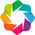

,STATE
3,AK
6,AK
11,AK
25,AK
34,AL


In [4]:
# opening the bokeh extension so all this code makes sense
hv.extension('bokeh')

# turning the nodes into datasets (I do it in two different ways but because it it one column in each it won't matter)
states = hv.Dataset(pd.DataFrame(node_list, columns=['STATE']))
states.data.head()
states_dem = hv.Dataset(node_dem["STATE"])
states_dem.data.head()
states_rep = hv.Dataset(node_rep["STATE"])
states_rep.data.head()
states_key = hv.Dataset(node_key["STATE"])
states_key.data.head()
states_krep = hv.Dataset(node_krep["STATE"])
states_krep.data.head()
states_kdem = hv.Dataset(node_kdem["STATE"])
states_kdem.data.head()


In [65]:
# from here on out it will all be running the Chord function over the dataframes and their respective datasets (the datasets produce the labels)
# there is also a .opts() command that lets you alter the characteristics of the diagram, feel free to play with those
# the first three are flows between states and the last three are flows from all other states to the four key states
# you can physically click on the chord diagrams and center them if you want before you save them as pngs
overall_diagram = hv.Chord((overall,states))
overall_diagram.opts(height=700, width=700, title="Overall Contribution Flows Between States in 2020 Senate Elections", labels="STATE")
overall_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='SOURCE_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (TOTAL_AMOUNT)

In [66]:
dem_diagram = hv.Chord((dem,states_dem))
dem_diagram.opts(height=700, width=700, title="Overall Democrat Contribution Flows Between States in 2020 Senate Elections", labels="STATE")
dem_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='SOURCE_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (AMOUNT)

In [67]:
rep_diagram = hv.Chord((rep,states_rep))
rep_diagram.opts(height=700, width=700, title="Overall Republican Contribution Flows Between States in 2020 Senate Elections", labels="STATE")
rep_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='SOURCE_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (AMOUNT)

In [5]:
key_diagram = hv.Chord((key,states_key))
key_diagram.opts(height=700, width=700, title="Overall Contribution Flows to Four Key States in 2020 Senate Elections", labels="STATE")
key_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='RECIPIENT_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (TOTAL_AMOUNT)

In [80]:
kdem_diagram = hv.Chord((key_dem,states_kdem))
kdem_diagram.opts(height=700, width=700, title="Democrat Contribution Flows to Four Key States in 2020 Senate Elections", labels="STATE")
kdem_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='RECIPIENT_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (AMOUNT)

In [79]:
krep_diagram = hv.Chord((key_rep,states_krep))
krep_diagram.opts(height=700, width=700, title="Republican Contribution Flows to Four Key States in 2020 Senate Elections", labels="STATE")
krep_diagram.opts(node_cmap="Category20", node_color="STATE",edge_cmap='Category20',edge_color='RECIPIENT_STATE')

:Chord   [SOURCE_STATE,RECIPIENT_STATE]   (AMOUNT)